In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  
)
from models.nnunet import nnUnet
from models.memory_unet import MemoryUnet
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [2]:
args = {
    "base_path" : "./dataset/syntax/",
    "memory_unet":{
        "layer_count":4,
        "channel_max":256,
        "downsampling":"maxpool",
        "normaliztion":"InstanceNorm2d",
        "activation" : "LeakyReLU",
        "first_layer_out_c" : 64
    },
    "image_shape" : (448,448),
    "in_c":1,
    
    "training_mode":"binary",
    "report_class_wise":True,
    "attention" : False,
    "batch_size" : 8,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":10,
    "f_int_scale" : 2,
    "full_report_cycle" : 1,
    "max_channels":512,
    "loss_type":"tversky",
    "output_base_path" : "./outputs",
    "name" : "binary-tests-tversky",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    ### Loss Functions
    "mask_ce_conf":{
        "imp_coef":1.0
    },
    "focal_ce_conf":{
        "gamma":2.0,
        "loss_scale":1.0,
        "imp_coef":1.0
    },
    "tversky_conf":{
        "alpha":0.5,
        "beta":0.5,
        "gamma":2.00,
        "weights":None,
        "imp_coef":1.0
    },
    "cl_dice_conf":{
        "imp_coef":1.0,
        "k":40
    },
    ### Optimizers
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
if(args["training_mode"] == "binary"):
    args["class_count"] = 2 
    class_map = {
        1:"fg"
    }

else:
    args["class_count"] = 26
    class_map = {
        1: '1',2: '2', 3: '3',4: '4',
        5: '5',6: '6',7:'9',8:'7',9:'9a',
        10:'10',11:'8',12:'10a',13:'12',14:'11',
        15:'12a',16:'12b',17:'13',18:'14',19:'14a',
        20:'14b',21:'15',22:'16',
        23: '16a',24: '16b',25: '16c',
    }

# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","mask CE-Loss",args["loss_type"],"cl dice loss"]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [3]:
if(args["training_mode"]!="binary"):
    b=0.999

    train_class_counts = [
        1200,374,375,369,303,525,537,
        198,340,70,21,310,1,61,320,129,
        63,305,107,49,127,38,232,43,48,31
    ]

    total = np.sum(train_class_counts)
    mask_ce_weights = np.log(total/np.array(train_class_counts))
    mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
    mask_ce_weights[0]=0.1

    args["mask_ce_weights"]=mask_ce_weights
    args["mask_ce_weights"]
else:
    args["mask_ce_weights"]=[0.1,1]

In [4]:
# args["t_alpha"] = [1,0.8]
args["tversky_conf"]["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    ]  
)

if(args["in_c"]==1):
    normalizer = normalize_xca
else:
    normalizer = A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
        max_pixel_value=255.0,
    )
train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:51: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:64: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(
    transform = train_transforms,
    data = train_images , 
    normalizer = normalizer,
    example_phase=False
)
valid_ds = TrainUnetDataset(
    transform = test_transforms,
    data = valid_images,
    normalizer = normalizer,
    example_phase=False
)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False
)


In [8]:

# model = nnUnet(args).to(args["device"])
model = MemoryUnet(args).to(args["device"])

loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(
#     model.parameters(), 
#     **args["adam_conf"]
# )
optimizer = torch.optim.SGD(
    model.parameters(),
    **args["sgd_conf"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model


encoder info : 
[1, 64, 128, 256, 256]
-----------------------
loss is set to tversky


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.9861, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (0)
total loss : 1.2725196423530578 - mask CE-Loss : 0.36963105654716494 - tversky : 0.3580290820598602
cl dice loss : 0.5448594961166382 - 
train avg metrics for epoch 0 :
avg dice : 0.43284860253334045 - avg precision : 0.32475200295448303 - avg recall : 0.6488111019134521
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 0.8689451313018799 - mask CE-Loss : 0.31942414164543154 - tversky : 0.1829717293381691
cl dice loss : 0.3665492558479309 - 
valid avg metrics for epoch 0 :
avg dice : 0.6065807342529297 - avg precision : 0.509306013584137 - avg recall : 0.749785840511322
fg => dice : 0.6065807342529297 p : 0.509306013584137 , r : 0.749785840511322
------------------------------------------------------------
New Best! : dice = 0.6065807342529297


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (1)
total loss : 0.8988900747299194 - mask CE-Loss : 0.28141122913360594 - tversky : 0.21405721592903137
cl dice loss : 0.4034216270446777 - 
train avg metrics for epoch 1 :
avg dice : 0.5846014022827148 - avg precision : 0.4784087836742401 - avg recall : 0.7513870000839233
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 0.792900185585022 - mask CE-Loss : 0.2808606958389282 - tversky : 0.1638577923178673
cl dice loss : 0.3481817007064819 - 
valid avg metrics for epoch 1 :
avg dice : 0.6389610171318054 - avg precision : 0.553101658821106 - avg recall : 0.7563750743865967
fg => dice : 0.6389610171318054 p : 0.553101658821106 , r : 0.7563750743865967
------------------------------------------------------------
New Best! : dice = 0.6389610171318054


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (2)
total loss : 0.8554074037075042 - mask CE-Loss : 0.2725745819807053 - tversky : 0.19756728667020798
cl dice loss : 0.3852655334472656 - 
train avg metrics for epoch 2 :
avg dice : 0.6011123657226562 - avg precision : 0.49676963686943054 - avg recall : 0.7609426379203796
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 0.7322892713546753 - mask CE-Loss : 0.26214786171913146 - tversky : 0.14358116507530214
cl dice loss : 0.3265602445602417 - 
valid avg metrics for epoch 2 :
avg dice : 0.6666013598442078 - avg precision : 0.5953748226165771 - avg recall : 0.7571858763694763
fg => dice : 0.6666013598442078 p : 0.5953748226165771 , r : 0.7571858763694763
------------------------------------------------------------
New Best! : dice = 0.6666013598442078


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (3)
total loss : 0.7989654636383057 - mask CE-Loss : 0.25898122537136076 - tversky : 0.17730379915237426
cl dice loss : 0.36268044090270996 - 
train avg metrics for epoch 3 :
avg dice : 0.6214648485183716 - avg precision : 0.5202432870864868 - avg recall : 0.7715897560119629
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 0.7230072498321534 - mask CE-Loss : 0.23959195196628572 - tversky : 0.1532255482673645
cl dice loss : 0.33018974781036375 - 
valid avg metrics for epoch 3 :
avg dice : 0.6613110303878784 - avg precision : 0.5789167881011963 - avg recall : 0.7710506916046143
fg => dice : 0.6613110303878784 p : 0.5789167881011963 , r : 0.7710506916046143
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (4)
total loss : 0.7697943859100341 - mask CE-Loss : 0.24818810141086578 - tversky : 0.1696384772658348
cl dice loss : 0.35196780729293825 - 
train avg metrics for epoch 4 :
avg dice : 0.63205486536026 - avg precision : 0.5331503748893738 - avg recall : 0.7760125994682312
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 0.697229163646698 - mask CE-Loss : 0.22597673714160918 - tversky : 0.14406874269247055
cl dice loss : 0.3271836829185486 - 
valid avg metrics for epoch 4 :
avg dice : 0.6705470681190491 - avg precision : 0.5796630382537842 - avg recall : 0.7952291369438171
fg => dice : 0.6705470681190491 p : 0.5796630382537842 , r : 0.7952291369438171
------------------------------------------------------------
New Best! : dice = 0.6705470681190491


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (5)
total loss : 0.7472644271850586 - mask CE-Loss : 0.23816433167457582 - tversky : 0.16435956341028213
cl dice loss : 0.3447405343055725 - 
train avg metrics for epoch 5 :
avg dice : 0.6376198530197144 - avg precision : 0.5349922180175781 - avg recall : 0.7889675498008728
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 0.6935873234272003 - mask CE-Loss : 0.24674181163311004 - tversky : 0.13356885492801665
cl dice loss : 0.3132766580581665 - 
valid avg metrics for epoch 5 :
avg dice : 0.6741563677787781 - avg precision : 0.5946138501167297 - avg recall : 0.7782664895057678
fg => dice : 0.6741563677787781 p : 0.5946138501167297 , r : 0.7782664895057678
------------------------------------------------------------
New Best! : dice = 0.6741563677787781


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (6)
total loss : 0.7251011874675751 - mask CE-Loss : 0.23250225287675857 - tversky : 0.15803185486793517
cl dice loss : 0.334567081451416 - 
train avg metrics for epoch 6 :
avg dice : 0.6436854004859924 - avg precision : 0.5390838384628296 - avg recall : 0.7986525893211365
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 0.7094834995269775 - mask CE-Loss : 0.2664948242902756 - tversky : 0.1317570301890373
cl dice loss : 0.3112316513061523 - 
valid avg metrics for epoch 6 :
avg dice : 0.6714750528335571 - avg precision : 0.590084969997406 - avg recall : 0.7789096832275391
fg => dice : 0.6714750528335571 p : 0.590084969997406 , r : 0.7789096832275391
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (7)
total loss : 0.7218794598579407 - mask CE-Loss : 0.2329376573562622 - tversky : 0.15663440352678298
cl dice loss : 0.33230739974975587 - 
train avg metrics for epoch 7 :
avg dice : 0.645259439945221 - avg precision : 0.5417541861534119 - avg recall : 0.7976562976837158
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 0.694455406665802 - mask CE-Loss : 0.26101240277290344 - tversky : 0.1295023652911186
cl dice loss : 0.3039406418800354 - 
valid avg metrics for epoch 7 :
avg dice : 0.6703814268112183 - avg precision : 0.5790907740592957 - avg recall : 0.7958417534828186
fg => dice : 0.6703814268112183 p : 0.5790907740592957 , r : 0.7958417534828186
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (8)
total loss : 0.7166609926223755 - mask CE-Loss : 0.22923884004354478 - tversky : 0.15637811106443406
cl dice loss : 0.3310440411567688 - 
train avg metrics for epoch 8 :
avg dice : 0.64772629737854 - avg precision : 0.5449148416519165 - avg recall : 0.7983554005622864
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 0.6634341812133789 - mask CE-Loss : 0.23082143783569337 - tversky : 0.12662478357553483
cl dice loss : 0.30598795890808106 - 
valid avg metrics for epoch 8 :
avg dice : 0.6872172951698303 - avg precision : 0.6140994429588318 - avg recall : 0.7801001071929932
fg => dice : 0.6872172951698303 p : 0.6140994429588318 , r : 0.7801001071929932
------------------------------------------------------------
New Best! : dice = 0.6872172951698303


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (9)
total loss : 0.6975615410804749 - mask CE-Loss : 0.22155662703514098 - tversky : 0.15082129848003387
cl dice loss : 0.32518361473083496 - 
train avg metrics for epoch 9 :
avg dice : 0.6520729660987854 - avg precision : 0.5497041940689087 - avg recall : 0.8012940883636475
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 0.646689453125 - mask CE-Loss : 0.2358666753768921 - tversky : 0.11623854845762253
cl dice loss : 0.29458423137664796 - 
valid avg metrics for epoch 9 :
avg dice : 0.7057405710220337 - avg precision : 0.6488932967185974 - avg recall : 0.7735046148300171
fg => dice : 0.7057405710220337 p : 0.6488932967185974 , r : 0.7735046148300171
------------------------------------------------------------
New Best! : dice = 0.7057405710220337
best result at epoch 10 with dice 0.7057405710220337


Save Model
Saving Memory
Saving All Plots


  0%|          | 0/25 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 12/12 [00:00<00:00, 3687.84it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./models/conv_lstm.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


processing ./temp_script.py


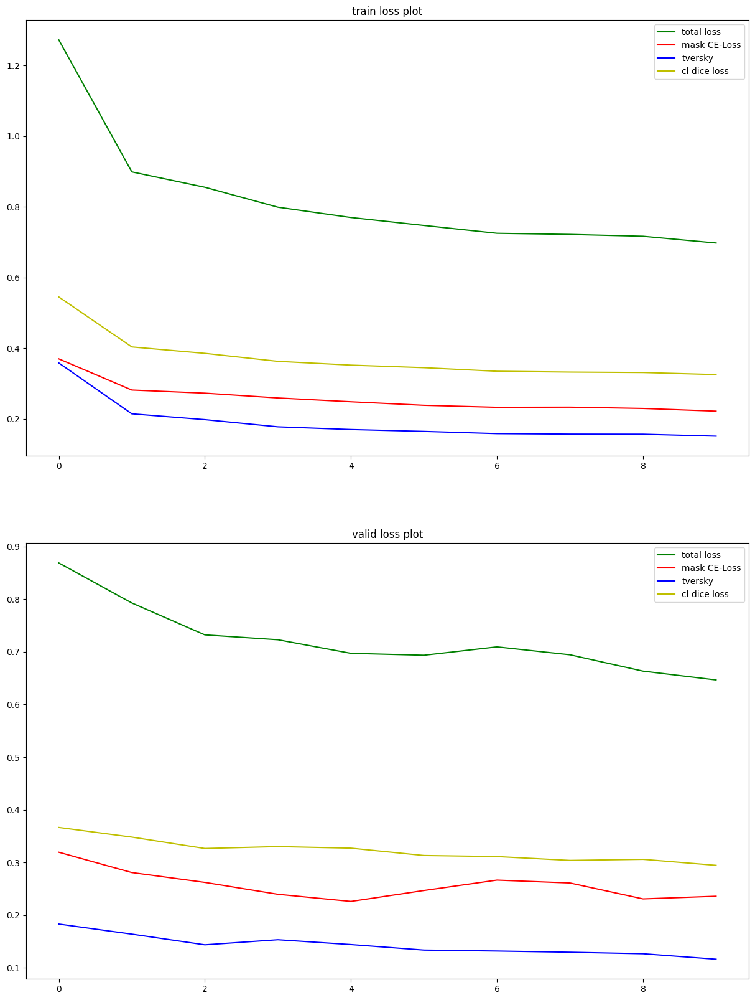

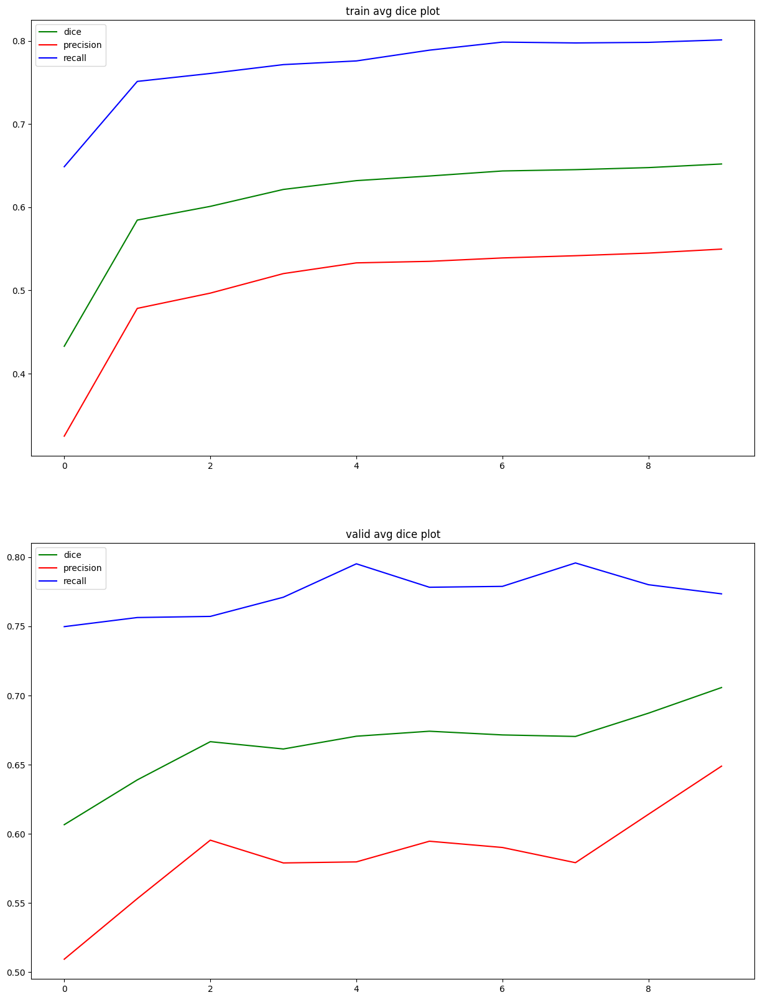

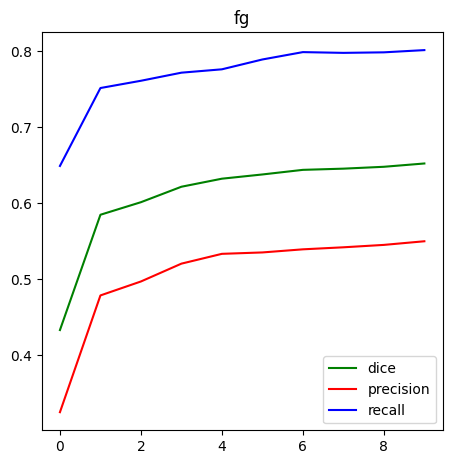

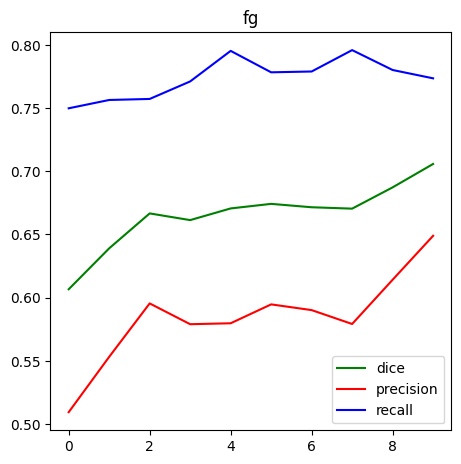

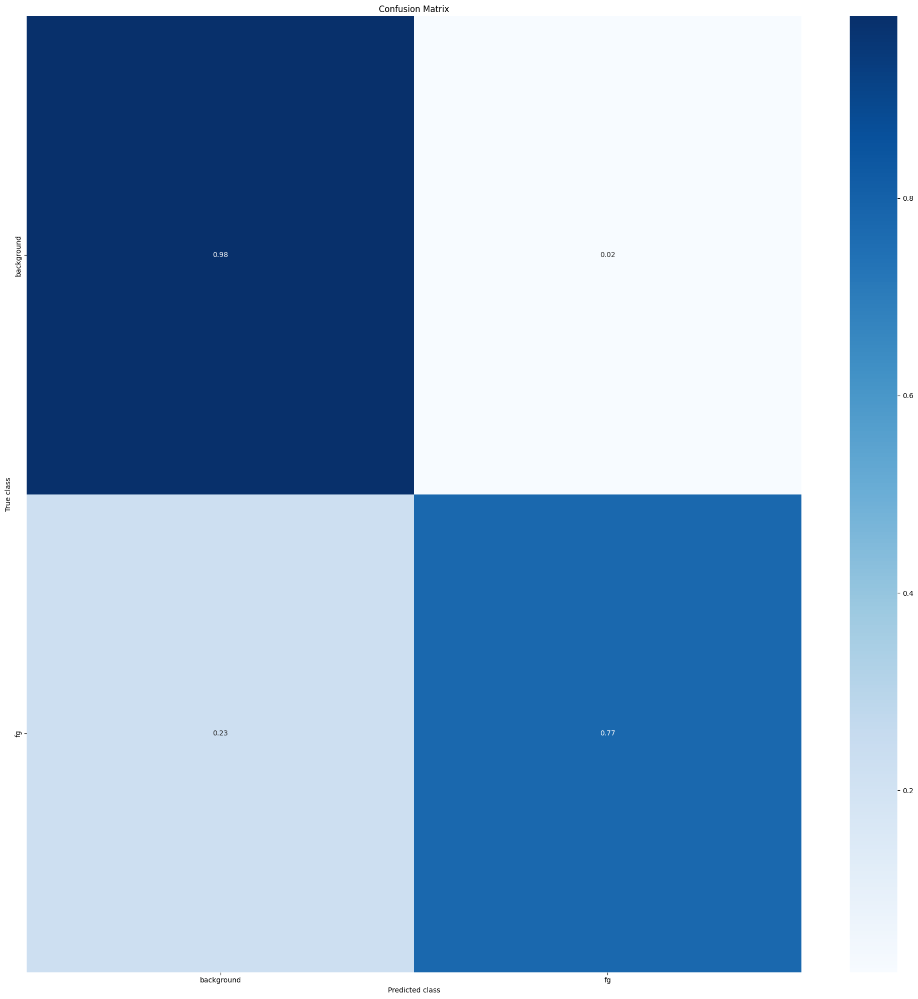

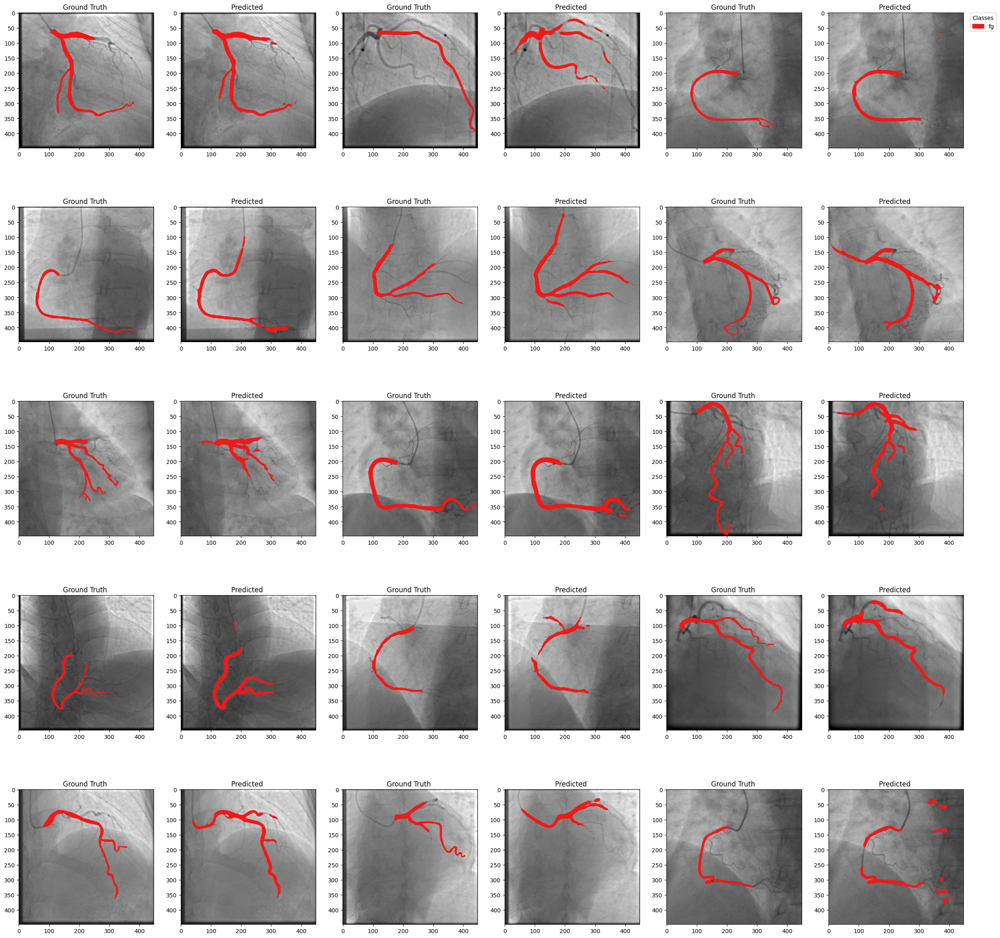

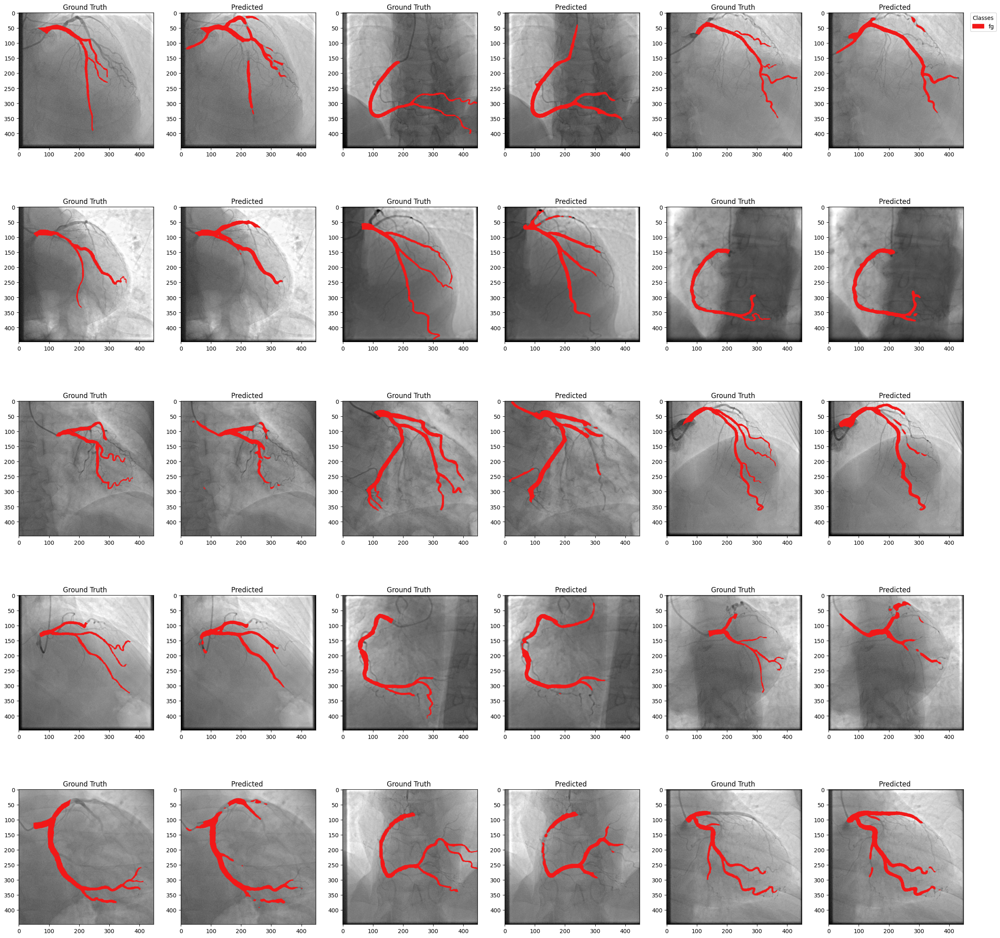

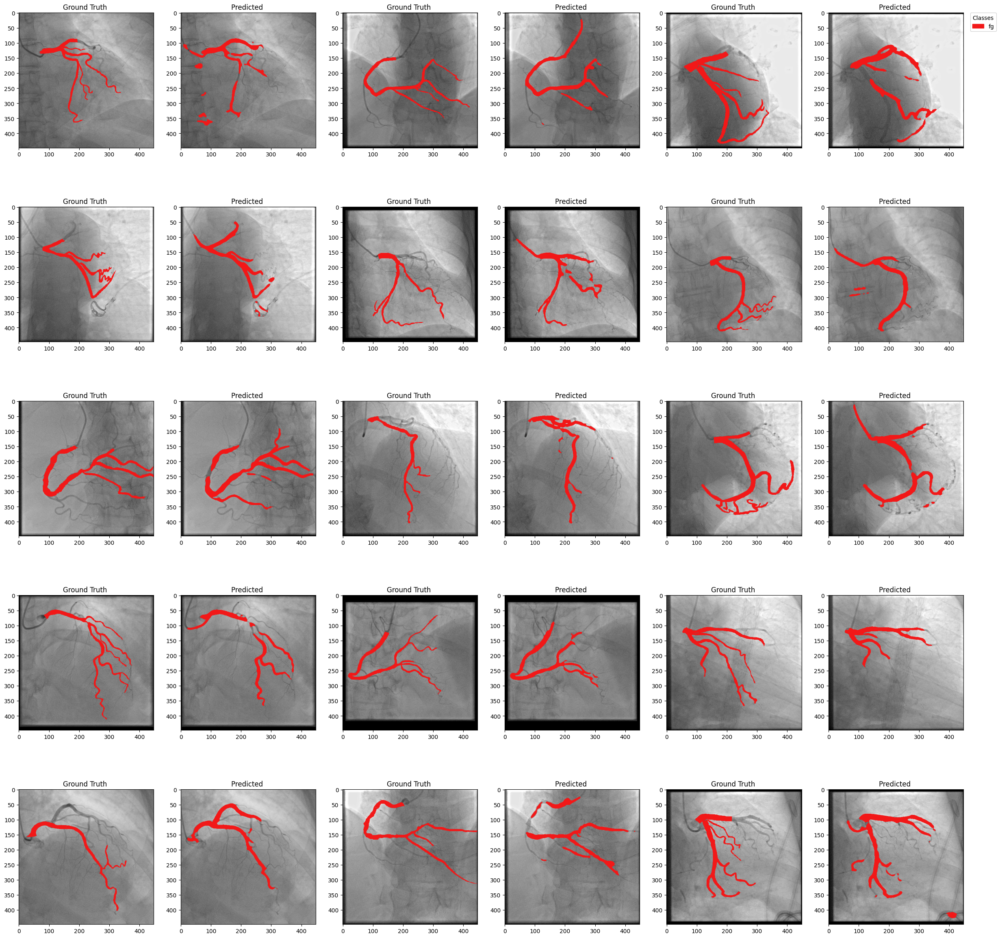

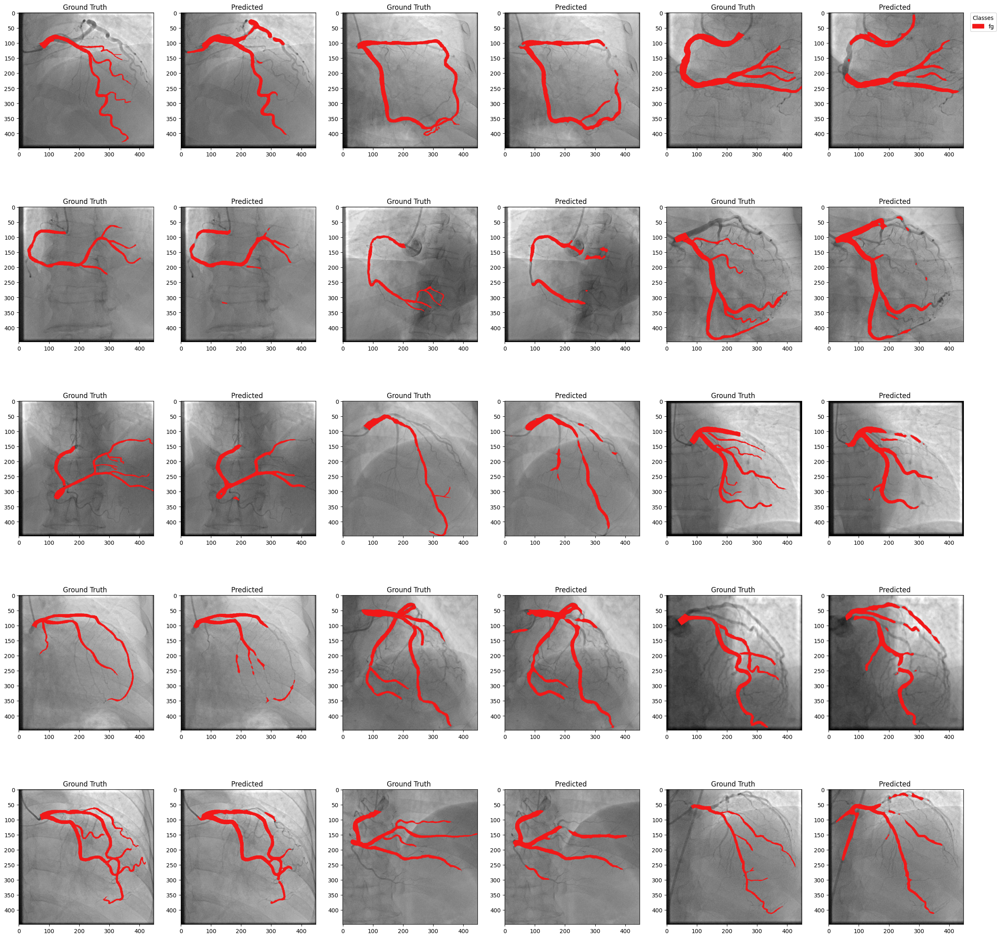

In [9]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    normalizer = normalizer,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"],
    training_mode = args["training_mode"]
)